In [53]:
#Importing the relevant libraries
import scyan
import re
import anndata
import scanpy as sc
import os
import gc
import random
import pandas as pd
import numpy as np
from matplotlib import rcParams
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.io  import imread
import skimage.io
import anndata as ad
import seaborn as sns 
from scipy import stats
import warnings
import matplotlib.cm as cm

In [54]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
warnings.filterwarnings('ignore')
sc.settings.set_figure_params(dpi=300, facecolor='white')

scanpy==1.9.3 anndata==0.8.0 umap==0.5.3 numpy==1.23.4 scipy==1.9.1 pandas==1.5.3 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [42]:
#set up the base directory
base_dir = 'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\mibi_analysis_yw\\notebook\\2023-07-18-KK-BC25_21_1_KK003'
#set up the directory with the cell tables after running cellpose
cell_table_dir = os.path.join(base_dir, "cellpose\\cell_table")
segmentation_dir = os.path.join(base_dir, "cellpose\\cellpose_visualization")
image_dir = os.path.join(base_dir, "image_data\\")

In [43]:
os.chdir(base_dir)

In [44]:
#cell size normalized tables
df = pd.read_csv(os.path.join(cell_table_dir,'cell_table_size_normalized.csv'))

In [45]:
#Getting the names of the columns in order to define the relevant channels
df.columns

Index(['cell_size', 'ASCT2', 'ATP5A', 'Au', 'CAV', 'CD11c', 'CD138', 'CD163',
       'CD20', 'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68',
       'CD8', 'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'Fe', 'GLS',
       'GLUT1', 'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'Membrane',
       'Noodle', 'Nuclei', 'PD1', 'PDL1', 'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox',
       'chan_39', 'chan_48', 'chan_69', 'chan_71', 'label', 'area',
       'eccentricity', 'major_axis_length', 'minor_axis_length', 'perimeter',
       'convex_area', 'equivalent_diameter', 'centroid-0', 'centroid-1',
       'major_minor_axis_ratio', 'perim_square_over_area',
       'major_axis_equiv_diam_ratio', 'convex_hull_resid', 'centroid_dif',
       'num_concavities', 'fov'],
      dtype='object')

In [46]:
#Renaming the X and Y coordinates
df = df.rename(columns={"centroid-0":"X",
                    "centroid-1":"Y"})

# define channels and background list to be removed
channels = ['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163',
       'CD20', 'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68',
       'CD8', 'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS',
       'GLUT1', 'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1', 'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox']



background = ['chan_39', 'chan_48', 'chan_69', 'chan_71', 'Au', 'Noodle', 'Fe', 'Membrane', 'Nuclei']
Morphology = ['cell_size','area', 'eccentricity', 'major_axis_length',
       'minor_axis_length', 'perimeter', 'convex_area', 'equivalent_diameter', 
       'major_minor_axis_ratio','perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif','major_minor_axis_ratio', 'perim_square_over_area',
       'major_axis_equiv_diam_ratio', 'convex_hull_resid', 'centroid_dif',
       'num_concavities', 'fov', 'url', 'AreaShape_Center_X',
       'AreaShape_Center_X_1', 'AreaShape_Center_Y', 'AreaShape_Center_Y_1',
       'NuclearIntensity']
       

# define observations and name of coordinates in order to load it into the anndata format
#can be any kind of metadata, fov_number, patient_ID, tissue_type, batch... - for squidpy need to put the X,Y into
# X.obsm - dont know how yet

obs_list = ["fov",'X','Y'] 

In [47]:
print(df)

       cell_size     ASCT2     ATP5A           Au       CAV     CD11c  \
0          494.0  0.000089  0.000591    13.218477  0.000957  0.000127   
1          234.0  0.000024  0.000015    12.670820  0.000057  0.000062   
2          258.0  0.000035  0.000066    10.928690  0.000190  0.000006   
3          227.0  0.000067  0.000014    14.363004  0.000057  0.000000   
4          600.0  0.000094  0.000201     5.639901  0.002435  0.000009   
...          ...       ...       ...          ...       ...       ...   
41795      110.0  0.003270  0.002543   130.751980  0.000657  0.000534   
41796      127.0  0.000023  0.000000  2227.484252  0.000000  0.000026   
41797      111.0  0.000343  0.000069   923.940315  0.000000  0.000161   
41798       59.0  0.000000  0.001009  2288.893008  0.000000  0.000023   
41799       23.0  0.000000  0.000000   164.056853  0.000000  0.000000   

              CD138     CD163          CD20      CD21  ...  \
0      1.225107e-04  0.000470  1.139806e-04  0.000071  ...   

In [48]:
# drop background channels
df = df.drop(background, axis = 1)

In [49]:
print(channels)
len(channels)

['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20', 'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8', 'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1', 'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1', 'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox']


37

In [50]:
print(df["fov"].unique())

['2023-07-18-KK-BC25_21_1_FOV1' '2023-07-18-KK-BC25_21_1_FOV2'
 '2023-07-18-KK-BC25_21_1_FOV3' '2023-07-18-KK-BC25_21_1_FOV4'
 '2023-07-18-KK-BC25_21_1_FOV5' '2023-07-18-KK-BC25_21_1_FOV6']


In [51]:
# define the fovs you want to get rid of
values_to_remove = []

# Filter the DataFrame to exclude rows containing the values
df = df[~df['fov'].isin(values_to_remove)]



In [52]:
print(df["fov"].unique())

['2023-07-18-KK-BC25_21_1_FOV1' '2023-07-18-KK-BC25_21_1_FOV2'
 '2023-07-18-KK-BC25_21_1_FOV3' '2023-07-18-KK-BC25_21_1_FOV4'
 '2023-07-18-KK-BC25_21_1_FOV5' '2023-07-18-KK-BC25_21_1_FOV6']


In [53]:
##i duplicate the fov column and call it roi, so i can rename them and use it for the future data
df['roi'] = df['fov']

In [54]:
#If you wanna rename the fovs, i will call them rois now:

df['roi']= df['roi'].replace({ '2023-07-18-KK-BC25_21_1_FOV1' : 'BC25_21_1_FOV1', 
'2023-07-18-KK-BC25_21_1_FOV2' : 'BC25_21_1_FOV2',
'2023-07-18-KK-BC25_21_1_FOV3' : 'BC25_21_1_FOV3',
'2023-07-18-KK-BC25_21_1_FOV4' : 'BC25_21_1_FOV4',
'2023-07-18-KK-BC25_21_1_FOV5' : 'BC25_21_1_FOV5',
'2023-07-18-KK-BC25_21_1_FOV6' : 'BC25_21_1_FOV6',})



In [55]:

df.head()

,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,...,X,Y,major_minor_axis_ratio,perim_square_over_area,major_axis_equiv_diam_ratio,convex_hull_resid,centroid_dif,num_concavities,fov,roi
0,494.0,0.000089,0.000591,0.000957,0.000127,1.225107e-04,0.000470,1.139806e-04,0.000071,0.000033,...,17.362348,6.417004,2.305554,20.121028,1.582500,0.081784,0.023140,2.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
1,234.0,0.000024,0.000015,0.000057,0.000062,1.186046e-05,0.000034,4.903481e-07,0.000021,0.000004,...,7.893162,19.717949,1.136583,15.852526,1.102817,0.067729,0.001739,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
2,258.0,0.000035,0.000066,0.000190,0.000006,1.520096e-05,0.000002,1.431607e-06,0.000015,0.000006,...,6.585271,50.825581,1.381453,14.086021,1.191361,0.040892,0.010645,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
3,227.0,0.000067,0.000014,0.000057,0.000000,4.146005e-08,0.000004,3.533279e-06,0.000007,0.000006,...,6.418502,70.114537,1.405923,13.146056,1.190527,0.029915,0.003291,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
4,600.0,0.000094,0.000201,0.002435,0.000009,1.215652e-04,0.000004,1.079076e-05,0.000025,0.000029,...,8.851667,131.171667,1.598173,16.739847,1.292033,0.043062,0.007900,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1


Quantile Filtering for size exclusion- if you are using filtered data pass this section

A way more robust approach is given is this answer, eliminating the bottom and top 1% of data. However, this eliminates a fixed fraction independant of the question if these data are really outliers. You might loose a lot of valid data, and on the other hand still keep some outliers if you have more than 1% or 2% of your data as outliers.

In [56]:
print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c         CD138  \
0          494.0  0.000089  0.000591  0.000957  0.000127  1.225107e-04   
1          234.0  0.000024  0.000015  0.000057  0.000062  1.186046e-05   
2          258.0  0.000035  0.000066  0.000190  0.000006  1.520096e-05   
3          227.0  0.000067  0.000014  0.000057  0.000000  4.146005e-08   
4          600.0  0.000094  0.000201  0.002435  0.000009  1.215652e-04   
...          ...       ...       ...       ...       ...           ...   
41795      110.0  0.003270  0.002543  0.000657  0.000534  1.456892e-03   
41796      127.0  0.000023  0.000000  0.000000  0.000026  0.000000e+00   
41797      111.0  0.000343  0.000069  0.000000  0.000161  6.599702e-05   
41798       59.0  0.000000  0.001009  0.000000  0.000023  4.341162e-05   
41799       23.0  0.000000  0.000000  0.000000  0.000000  1.964171e-05   

          CD163          CD20      CD21      CD23  ...            X  \
0      0.000470  1.139806e-04  0.000071 

In [57]:
df['cell_size'].describe()

count    41800.000000
mean       434.643804
std        302.734069
min         15.000000
25%        206.000000
50%        367.000000
75%        600.000000
max       2493.000000
Name: cell_size, dtype: float64

In [58]:
df['cell_size'].head

<bound method NDFrame.head of 0        494.0
1        234.0
2        258.0
3        227.0
4        600.0
         ...  
41795    110.0
41796    127.0
41797    111.0
41798     59.0
41799     23.0
Name: cell_size, Length: 41800, dtype: float64>

In [59]:
#cols = df.select_dtypes('float').columns  # limits to a (float), b (int) and e (timedelta)
df_sub = df.loc[:, 'cell_size']

In [60]:
print(df_sub)
      

0        494.0
1        234.0
2        258.0
3        227.0
4        600.0
         ...  
41795    110.0
41796    127.0
41797    111.0
41798     59.0
41799     23.0
Name: cell_size, Length: 41800, dtype: float64


In [61]:

# Calculate the cutoff values for the top and bottom 1% using quantile()
q_low = df['cell_size'].quantile(0.01)
q_high = df['cell_size'].quantile(0.99)

#Filter the DataFrame to only include rows where 'cell_size' values are between the 1% quantiles
df_filtered = df[(df['cell_size'] > q_low) & (df['cell_size'] < q_high)]


In [62]:
print(df_filtered)

       cell_size     ASCT2     ATP5A       CAV     CD11c         CD138  \
0          494.0  0.000089  0.000591  0.000957  0.000127  1.225107e-04   
1          234.0  0.000024  0.000015  0.000057  0.000062  1.186046e-05   
2          258.0  0.000035  0.000066  0.000190  0.000006  1.520096e-05   
3          227.0  0.000067  0.000014  0.000057  0.000000  4.146005e-08   
4          600.0  0.000094  0.000201  0.002435  0.000009  1.215652e-04   
...          ...       ...       ...       ...       ...           ...   
41794      131.0  0.000920  0.000046  0.000000  0.002678  1.544486e-03   
41795      110.0  0.003270  0.002543  0.000657  0.000534  1.456892e-03   
41796      127.0  0.000023  0.000000  0.000000  0.000026  0.000000e+00   
41797      111.0  0.000343  0.000069  0.000000  0.000161  6.599702e-05   
41798       59.0  0.000000  0.001009  0.000000  0.000023  4.341162e-05   

          CD163          CD20      CD21      CD23  ...            X  \
0      0.000470  1.139806e-04  0.000071 

In [63]:
df=df_filtered

Bringing the values up to CyTOF level:

In [64]:
# Change target directory
os.chdir('C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\mibi_analysis_yw\\notebook\\2023-07-18-KK-BC25_21_1_KK003\\cellpose\\output')

In [65]:
#check the second last highest number- which value should you multiply it with so it reaches around 10000 and
#second lowest is around 100?

dco= df[channels].quantile(.9999)
dco=dco.sort_values(ascending=True)
print(dco)


# Save dco as CSV
dco.to_csv("sorted_top99percentile_markers.csv", header=True)

median = dco.median()
median_name = dco[dco == median].index[0]
print(median)
print(median_name)

CD21       0.000695
PDL1       0.001134
Tox        0.001414
TCF        0.002171
CD23       0.002317
FOXP3      0.002323
IL10       0.002659
CytC       0.002868
PD1        0.002876
GLS        0.003177
CXCL13     0.004174
CPT1A      0.004490
CD163      0.006061
CD56       0.008418
CS         0.009786
CD3        0.011225
CD138      0.011742
Ki67       0.012148
ATP5A      0.012466
ASCT2      0.012878
GZMB       0.013366
CD11c      0.015760
CD4        0.016258
CD98       0.018459
CD68       0.024293
PKM2       0.025289
CD36       0.025828
HLADQA1    0.026951
HLADR      0.031758
CD20       0.036149
GLUT1      0.037603
CD8        0.047939
CD45       0.054116
PanCK      0.057764
CAV        0.059307
HLAI       0.115517
SMA        0.251880
Name: 0.9999, dtype: float64
0.012465602794195717
ATP5A


from above: the median number should be equal to 5000, so in this case =5000/ median


In [66]:
multiply= 5000/median
print(multiply)

401103.7478531018


In [67]:
df[channels] = df[channels].multiply(multiply)


In [68]:
df.head()

,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,...,X,Y,major_minor_axis_ratio,perim_square_over_area,major_axis_equiv_diam_ratio,convex_hull_resid,centroid_dif,num_concavities,fov,roi
0,494.0,35.653391,236.964824,383.904413,51.064573,49.139508,188.506565,45.718029,28.368292,13.172082,...,17.362348,6.417004,2.305554,20.121028,1.582500,0.081784,0.023140,2.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
1,234.0,9.509195,6.146245,22.819358,24.907869,4.757276,13.642523,0.196680,8.313297,1.507150,...,7.893162,19.717949,1.136583,15.852526,1.102817,0.067729,0.001739,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
2,258.0,14.004204,26.285727,76.226148,2.244658,6.097160,0.841709,0.574223,6.040995,2.545792,...,6.585271,50.825581,1.381453,14.086021,1.191361,0.040892,0.010645,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
3,227.0,26.933170,5.693733,22.671372,0.000000,0.016630,1.669624,1.417212,2.750846,2.337810,...,6.418502,70.114537,1.405923,13.146056,1.190527,0.029915,0.003291,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1
4,600.0,37.627923,80.451990,976.606397,3.734054,48.760238,1.529309,4.328213,10.216859,11.512889,...,8.851667,131.171667,1.598173,16.739847,1.292033,0.043062,0.007900,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1


In [69]:
#save the new dataframe as csv :

df.to_csv(os.path.join(cell_table_dir,('cell_table_size_normalized_cellposev2_filtered_cytoflevel.csv')), index=False)


In [70]:
#Read in the df if you are starting after cytof brought up data:

df = pd.read_csv(os.path.join(cell_table_dir,'cell_table_size_normalized_cellposev2_filtered_cytoflevel.csv'))


##make sure you check the data: 
print(df)

       cell_size        ASCT2        ATP5A         CAV        CD11c  \
0          494.0    35.653391   236.964824  383.904413    51.064573   
1          234.0     9.509195     6.146245   22.819358    24.907869   
2          258.0    14.004204    26.285727   76.226148     2.244658   
3          227.0    26.933170     5.693733   22.671372     0.000000   
4          600.0    37.627923    80.451990  976.606397     3.734054   
...          ...          ...          ...         ...          ...   
40914      131.0   368.828576    18.404171    0.000000  1073.971901   
40915      110.0  1311.688891  1019.944208  263.383042   214.089632   
40916      127.0     9.125846     0.000000    0.000000    10.360888   
40917      111.0   137.622657    27.556383    0.000000    64.517039   
40918       59.0     0.000000   404.889440    0.000000     9.037592   

            CD138       CD163         CD20       CD21        CD23  ...  \
0       49.139508  188.506565    45.718029  28.368292   13.172082  ...   

In [71]:
#df= df.drop(df.columns[0], axis=1)

Arcsinh transforming data:

In [72]:
# Apply arcsin transformation with cofactor of 5 to selected columns
df[channels] = np.arcsinh(df[channels]/5)

# Print the updated DataFrame
print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          494.0  2.662434  4.551732  5.034145  3.019189  2.980951  4.323018   
1          234.0  1.398855  1.034564  2.223111  2.308818  0.846627  1.728906   
2          258.0  1.753512  2.361661  3.418488  0.435075  1.028354  0.167557   
3          227.0  2.385575  0.976161  2.216756  0.000000  0.003326  0.328011   
4          600.0  2.715841  3.472334  5.967800  0.690594  2.973243  0.301283   
...          ...       ...       ...       ...       ...       ...       ...   
40914      131.0  4.994087  2.014248  0.000000  6.062834  5.512637  1.541924   
40915      110.0  6.262784  6.011218  4.657409  4.450240  5.454253  3.322978   
40916      127.0  1.362599  0.000000  0.000000  1.475456  0.000000  0.000000   
40917      111.0  4.008555  2.408074  0.000000  3.252137  2.368586  0.892926   
40918       59.0  0.000000  5.087361  0.000000  1.354086  1.960905  0.973894   

           CD20      CD21      CD23  ..

In [73]:
min_val = np.min(df[channels])
max_val = np.max(df[channels])

print("Minimum value:", min_val)
print("Maximum value:", max_val)

Minimum value: ASCT2      0.0
ATP5A      0.0
CAV        0.0
CD11c      0.0
CD138      0.0
CD163      0.0
CD20       0.0
CD21       0.0
CD23       0.0
CD3        0.0
CD36       0.0
CD4        0.0
CD45       0.0
CD56       0.0
CD68       0.0
CD8        0.0
CD98       0.0
CPT1A      0.0
CS         0.0
CXCL13     0.0
CytC       0.0
FOXP3      0.0
GLS        0.0
GLUT1      0.0
GZMB       0.0
HLADQA1    0.0
HLADR      0.0
HLAI       0.0
IL10       0.0
Ki67       0.0
PD1        0.0
PDL1       0.0
PKM2       0.0
PanCK      0.0
SMA        0.0
TCF        0.0
Tox        0.0
dtype: float64
Maximum value: ASCT2       7.807989
ATP5A       7.698113
CAV        10.068589
CD11c       8.211211
CD138       7.767235
CD163       7.469513
CD20        9.372187
CD21        5.749924
CD23        6.211734
CD3         8.714881
CD36        8.670131
CD4         9.275218
CD45        9.396577
CD56        7.793432
CD68        9.018834
CD8         9.184103
CD98        8.318681
CPT1A       7.009940
CS          7.546757
C

In [74]:
print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          494.0  2.662434  4.551732  5.034145  3.019189  2.980951  4.323018   
1          234.0  1.398855  1.034564  2.223111  2.308818  0.846627  1.728906   
2          258.0  1.753512  2.361661  3.418488  0.435075  1.028354  0.167557   
3          227.0  2.385575  0.976161  2.216756  0.000000  0.003326  0.328011   
4          600.0  2.715841  3.472334  5.967800  0.690594  2.973243  0.301283   
...          ...       ...       ...       ...       ...       ...       ...   
40914      131.0  4.994087  2.014248  0.000000  6.062834  5.512637  1.541924   
40915      110.0  6.262784  6.011218  4.657409  4.450240  5.454253  3.322978   
40916      127.0  1.362599  0.000000  0.000000  1.475456  0.000000  0.000000   
40917      111.0  4.008555  2.408074  0.000000  3.252137  2.368586  0.892926   
40918       59.0  0.000000  5.087361  0.000000  1.354086  1.960905  0.973894   

           CD20      CD21      CD23  ..

99.9% percentile normalisation:

here we find the 99.9% of each marker:

In [75]:
percentiles = df[channels].apply(lambda col: np.percentile(col, 99.9))

print(percentiles)

ASCT2       7.297276
ATP5A       7.134345
CAV         8.450090
CD11c       7.443173
CD138       6.925989
CD163       5.965548
CD20        8.089340
CD21        4.005079
CD23        5.419123
CD3         6.813940
CD36        7.847146
CD4         7.504803
CD45        8.854279
CD56        5.920816
CD68        7.718979
CD8         8.497676
CD98        7.512229
CPT1A       6.166082
CS          7.146928
CXCL13      6.084493
CytC        5.719230
FOXP3       4.850458
GLS         5.674187
GLUT1       8.205145
GZMB        6.544253
HLADQA1     7.966536
HLADR       8.146837
HLAI        9.445402
IL10        5.367415
Ki67        7.086352
PD1         5.433908
PDL1        4.680526
PKM2        8.006883
PanCK       8.545156
SMA        10.335576
TCF         5.386514
Tox         4.630545
dtype: float64


now we divide each marker with it is highest value:

In [76]:
df[channels] = df[channels].divide(percentiles)

print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          494.0  0.364853  0.638003  0.595751  0.405632  0.430401  0.724664   
1          234.0  0.191695  0.145012  0.263087  0.310193  0.122239  0.289815   
2          258.0  0.240297  0.331027  0.404550  0.058453  0.148478  0.028087   
3          227.0  0.326913  0.136826  0.262335  0.000000  0.000480  0.054984   
4          600.0  0.372172  0.486707  0.706241  0.092782  0.429288  0.050504   
...          ...       ...       ...       ...       ...       ...       ...   
40914      131.0  0.684377  0.282331  0.000000  0.814550  0.795935  0.258471   
40915      110.0  0.858236  0.842575  0.551167  0.597896  0.787505  0.557028   
40916      127.0  0.186727  0.000000  0.000000  0.198229  0.000000  0.000000   
40917      111.0  0.549322  0.337533  0.000000  0.436929  0.341985  0.149680   
40918       59.0  0.000000  0.713080  0.000000  0.181923  0.283123  0.163253   

           CD20      CD21      CD23  ..

In [77]:
df.columns

Index(['cell_size', 'ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20',
       'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8',
       'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1',
       'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1',
       'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox', 'label', 'area', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'perimeter', 'convex_area',
       'equivalent_diameter', 'X', 'Y', 'major_minor_axis_ratio',
       'perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif', 'num_concavities', 'fov', 'roi'],
      dtype='object')

Let's check the data:

In [78]:
df[channels].plot(subplots=True, layout=(10,5), kind = 'kde',figsize = (100,100), xlim = (-0.5,1), linewidth= 2)  
plt.savefig("datasubplot_cellposev2.png", bbox_inches = 'tight')

MemoryError: In RendererAgg: Out of memory

<Figure size 30000x30000 with 50 Axes>

Now you have cell size normalized, brought up to CyTOF level, arcsinh transformed and 99.9% normalized data. We save it here. We continue with clustering.

In [79]:
df.to_csv(os.path.join(cell_table_dir,('cell_table_size_normalized_cellposev2_filtered_preprocessed.csv')), index=False)

In [41]:
os.getcwd()

'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\mibi_analysis_yw\\notebook\\2023-07-18-KK-BC25_21_1_KK003\\cellpose\\output'

## Turn the data into anndata format

In [123]:
##You can also start from here by reading in the dataframe:
df = pd.read_csv(os.path.join(cell_table_dir, 'cell_table_size_normalized_cellposev2_filtered_preprocessed.csv'))

In [124]:
obs_list = ["fov", "roi",'X','Y'] 

In [125]:
def generate_anndata(df, channels_to_use, obs_list):    
    expression_data = np.array(df[channels_to_use])
    metadata = df[obs_list]
    anndata_obj = ad.AnnData(expression_data, 
                             obs=metadata,
                            dtype="float")
    anndata_obj.var_names = pd.Series(channels_to_use).astype("string").to_list()
    return anndata_obj

In [126]:
#generate the anndata from the cell table- dont know how to add X,Y as X.obsm- for squidpy!
adata = generate_anndata(df, channels_to_use= channels, obs_list= obs_list)

In [127]:
#Check for variable names in anndata
adata.var_names

Index(['ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20', 'CD21',
       'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8', 'CD98',
       'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1', 'GZMB',
       'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1', 'PKM2',
       'PanCK', 'SMA', 'TCF', 'Tox'],
      dtype='object')

In [128]:
adata.X

array([[0.36485319, 0.63800283, 0.59575051, ..., 0.64567594, 0.60927365,
        0.27021855],
       [0.19169544, 0.14501178, 0.26308721, ..., 0.87381997, 0.27711512,
        0.15839402],
       [0.24029674, 0.33102699, 0.40455046, ..., 0.84137214, 0.23814055,
        0.06464438],
       ...,
       [0.18672709, 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.54932206, 0.33753265, 0.        , ..., 0.        , 0.36472059,
        0.17364333],
       [0.        , 0.71308038, 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [129]:
min_val = np.min(adata.X)
max_val = np.max(adata.X)

print("Minimum value:", min_val)
print("Maximum value:", max_val)


Minimum value: 0.0
Maximum value: 1.4356580954384697


In [130]:
##save here as anndata if you need:
adata.write_h5ad(os.path.join(cell_table_dir,('cell_table_size_normalized_cellposev2_filtered_preprocessed.h5ad')))

### If you are continuing from this step onwards, first load your data as anndata:

In [56]:
####read in anndata object, if you want to start from here
###set up the base directory
base_dir = 'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\mibi_analysis_yw\\notebook\\2023-07-18-KK-BC25_21_1_KK003'
#set up the directory with the cell tables after running mesmer
cell_table_dir = os.path.join(base_dir, "cellpose\\cell_table")
segmentation_dir = os.path.join(base_dir, "cellpose\\cellpose_visualization")
image_dir = os.path.join(base_dir, "image_data\\")
os.chdir('C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\mibi_analysis_yw\\notebook\\2023-07-18-KK-BC25_21_1_KK003\\cellpose\\output')

In [57]:
adata = anndata.read_h5ad(os.path.join(cell_table_dir,('cell_table_size_normalized_cellposev2_filtered_preprocessed.h5ad')))

In [58]:
##adding batch information (if you acquired your data in different runs) - Remove # if you want to run this
# Assuming `adata` is your AnnData object
#pattern = r'set(.*?)_'  # Regular expression pattern

# Extract information and create new column in `obs`
#adata.obs['batch'] = adata.obs['fov'].apply(lambda x: re.search(pattern, x).group(1) if re.search(pattern, x) else '')

In [59]:
# Assuming `adata` is your AnnData object - Remove # if you want to run this
#print(adata.obs['batch'])

### Scyan clustering

In [60]:
#Perform scaling of the data to bring 0 to -1 and standard deviation is 1
scyan.preprocess.scale(adata)

[INFO] (scyan.preprocess) Data will be centered and standardised. This is advised only when using spectral/flow data (if this is not your case, consider running 'asinh_transform' instead of 'auto_logicle_transform').


computing PCA
    with n_comps=36
    finished (0:00:00)


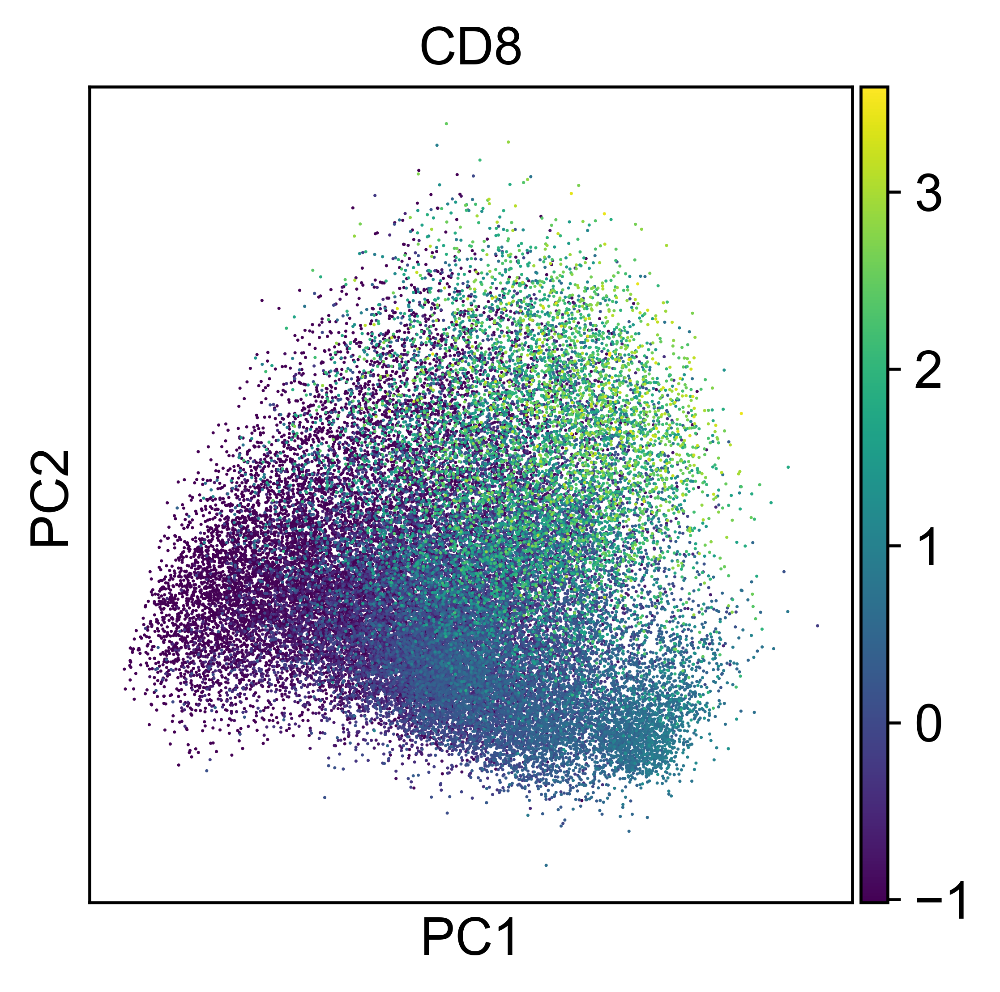

In [61]:
sc.tl.pca(adata, svd_solver='arpack') # peform PCA
sc.pl.pca(adata, color='CD8') # scatter plot in the PCA coordinates

In [62]:
##This is for batch correction - Remove # if you want to use this
#sc.external.pp.bbknn(adata, batch_key='batch')

In [63]:
adata.obs

,fov,roi,X,Y
0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,17.362348,6.417004
1,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,7.893162,19.717949
2,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,6.585271,50.825581
3,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,6.418502,70.114537
4,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,8.851667,131.171667
...,...,...,...,...
40914,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.442748,951.076336
40915,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.445455,1232.127273
40916,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.834646,1534.677165
40917,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2044.549550,1104.468468


In [64]:
data = pd.DataFrame(adata.X,columns=adata.var_names)

In [65]:
#Check the anndata- scyan scaled version
pd.DataFrame(adata.X).describe()

,0,1,2,3,4,5,6,7,8,9,...,27,28,29,30,31,32,33,34,35,36
count,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,...,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04,4.091900e+04
mean,8.159981e-15,-8.246456e-15,-6.756920e-15,6.623559e-15,-1.586154e-14,1.265533e-15,-3.678520e-15,-5.278843e-15,-7.773791e-15,-2.933926e-15,...,1.271368e-14,8.296119e-15,4.989896e-15,6.162355e-15,1.155789e-14,1.208022e-14,-1.289149e-14,2.778339e-17,-2.233784e-15,-7.362597e-16
std,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,...,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00,1.000012e+00
min,-2.352527e+00,-1.801540e+00,-1.116741e+00,-1.513374e+00,-1.956023e+00,-9.960785e-01,-1.158987e+00,-1.339308e+00,-1.311591e+00,-1.550471e+00,...,-3.955789e+00,-1.660326e+00,-1.495189e+00,-1.168544e+00,-1.406256e+00,-3.492858e+00,-1.395682e+00,-1.191741e+00,-1.888383e+00,-1.059322e+00
25%,-5.978628e-01,-7.165136e-01,-9.684575e-01,-8.003536e-01,-6.374631e-01,-9.160764e-01,-8.771730e-01,-9.417099e-01,-8.814250e-01,-6.864229e-01,...,-5.758286e-01,-7.413303e-01,-6.840335e-01,-9.348720e-01,-8.925858e-01,-5.599121e-01,-8.362942e-01,-1.151249e+00,-6.644549e-01,-9.882065e-01
50%,5.913759e-02,1.448920e-01,-1.728127e-01,1.995204e-02,1.261400e-01,-2.027598e-01,-9.983347e-02,-3.028477e-03,-5.739077e-02,-1.354561e-01,...,6.891503e-02,5.673997e-02,-1.043097e-01,-1.075678e-01,5.792484e-03,1.126124e-01,-1.176923e-01,-4.427193e-02,1.606976e-02,-1.992125e-01
75%,7.001670e-01,7.800053e-01,7.427328e-01,6.989110e-01,7.296319e-01,6.113442e-01,5.609889e-01,7.638488e-01,6.580936e-01,5.192578e-01,...,6.995692e-01,6.985501e-01,4.993804e-01,6.775865e-01,7.370286e-01,7.365071e-01,8.011626e-01,8.776926e-01,6.998361e-01,7.354120e-01
max,2.636985e+00,2.356075e+00,3.674731e+00,3.143305e+00,2.541899e+00,5.928840e+00,4.805111e+00,5.111840e+00,3.715694e+00,4.270256e+00,...,2.476400e+00,5.368880e+00,4.417066e+00,5.170490e+00,4.169504e+00,2.299148e+00,2.975259e+00,2.130203e+00,3.571538e+00,4.614927e+00


Now you should modify your scyan table for clustering. An example link:
    
    https://docs.google.com/spreadsheets/d/1T4XTKp7n0C-ZtitHTYaQgc8z4y3mGFGR/edit#gid=81068921

In [66]:
#Importing the model for scyan with relevant cell populations and lineage markers
#Check https://mics-lab.github.io/scyan/advice/ for advice about constructing such cell tables
#Hierarchical cell populations can also be included 
#https://mics-lab.github.io/scyan/tutorials/usage/#working-with-hierarchical-populations

table = pd.read_excel(os.path.join(cell_table_dir,'table_scyan.xlsx'),index_col=[0, 1,2,3])

In [67]:
table

,,,,CD4,CD8,CD3,FOXP3,SMA,CD45,CD68,CD163,CAV,PanCK,CD56,CD11c,CD21,CD138,CD20,HLADR
Population,Level_3,Level_2,Level_1,,,,,,,,,,,,,,,,
CD8,T cells,Lymphoid,Immune,-1.0,1.0,1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
CD4,T cells,Lymphoid,Immune,1.0,-1.0,1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
Treg,T cells,Lymphoid,Immune,1.0,-1.0,1.0,1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
B cells,B cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,NaN,-1.0,1.0,NaN
CD21+ B cells,B cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,-1,-1,1.0,-1.0,1.0,NaN
Plasma cells,B cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,1.0,-1,-1.0,-1,NaN,-1,-1,NaN,1.0,NaN,NaN
NK cells,All NK cells,Lymphoid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,-1,-1.0,-1,NaN,1,-1,-1.0,-1.0,-1.0,-1.0
Macrophages,Mono/Mac,Myeloid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,1,-1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0
M2 like Macrophages,Mono/Mac,Myeloid,Immune,NaN,-1.0,-1.0,-1,-1.0,NaN,1,1.0,-1,NaN,-1,-1,-1.0,-1.0,-1.0,-1.0


In [68]:
#UMAP
#Use only the cell-type markers (recommended), or your choose your own list of markers
scyan.tools.umap(adata, markers=table.columns)

[INFO] (scyan.tools.representation) Fitting UMAP...


UMAP(min_dist=0.5, tqdm_kwds={'bar_format': '{desc}: {percentage:3.0f}%| {bar} {n_fmt}/{total_fmt} [{elapsed}]', 'desc': 'Epochs completed', 'disable': True})

KeyError: 'Could not find key batch in .var_names or .obs.columns.'

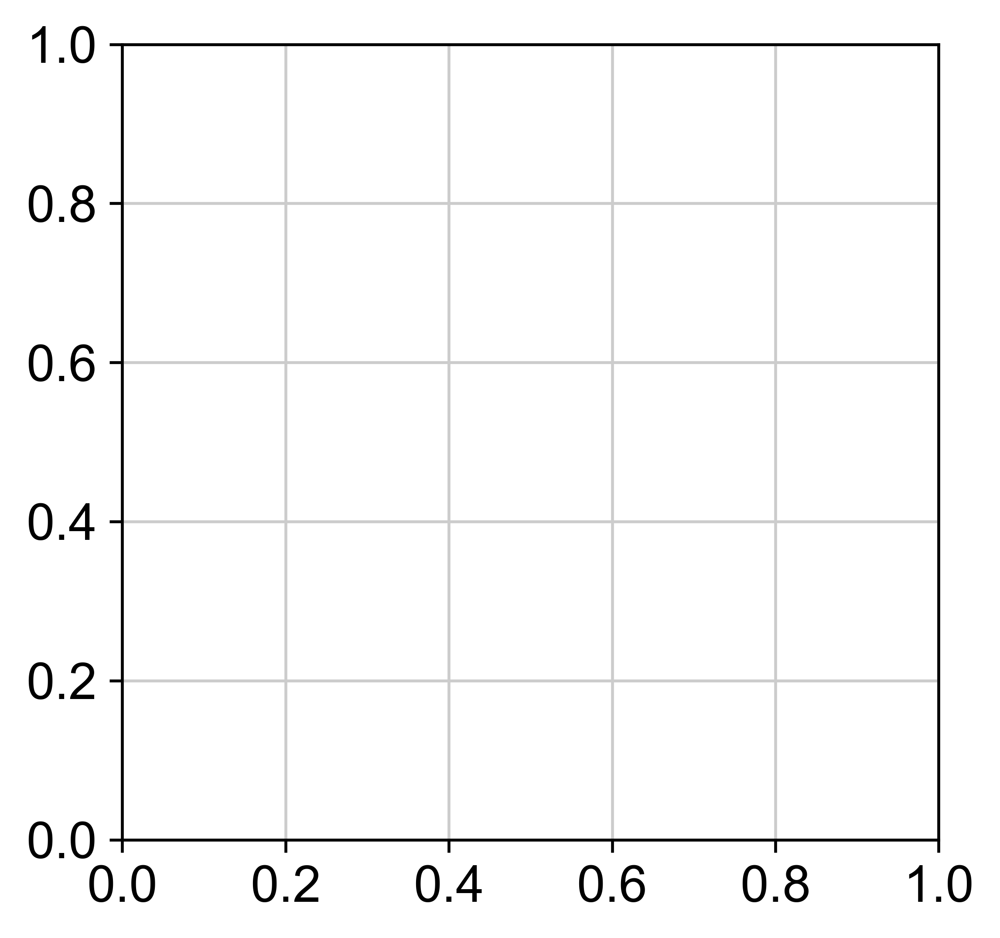

In [69]:
scyan.plot.umap(adata, color="batch")

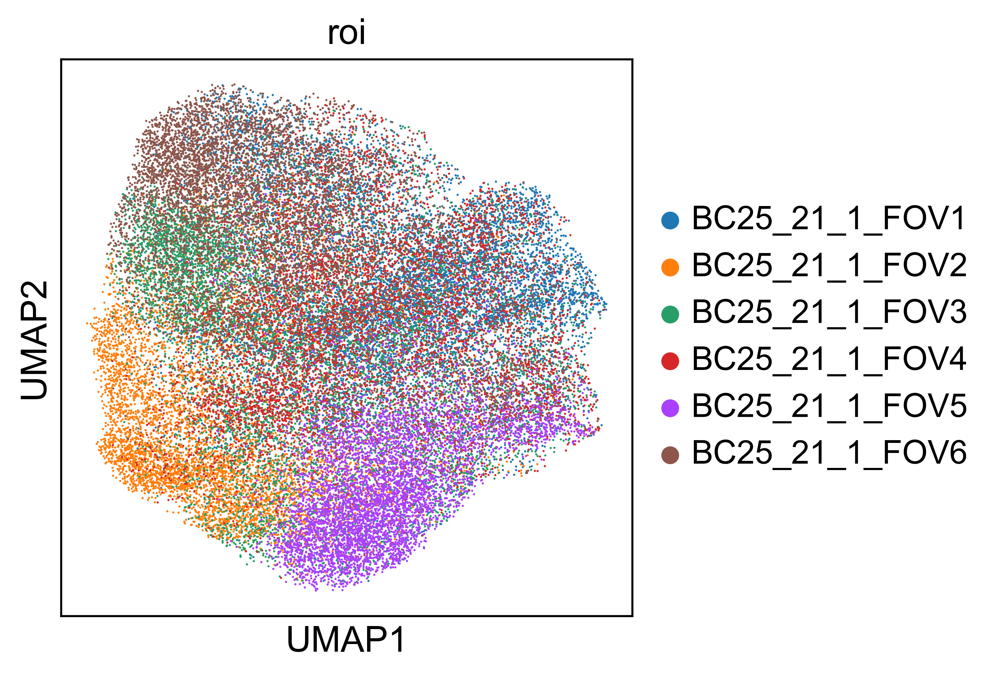

In [70]:
scyan.plot.umap(adata, color="roi")

In [71]:
# Change batch correction to True or False here
batch_effect_correction = False

if not batch_effect_correction:
    model = scyan.Scyan(adata,table,batch_size=5000, prior_std=0.3)
else:
    # When training for the first time on a new dataset, we advise to start with the default arguments (i.e., remove 'prior_std' and 'lr')
    # if there are batch effects, define them in the batch_key argument
    model = scyan.Scyan(adata,table, batch_key='fov',  batch_size = 20000)

# For better batch effect correction, we advise to increase the default 'patience' and decrease 'min_delta'
# NB: if you have less than 1 million cells, you can also increase 'max_epochs'
model.fit(patience=10, min_delta=0.1, max_epochs=250)

[INFO] (scyan.model) Initialized Scyan model with N=40919 cells, P=14 populations and M=16 markers.
   ├── No covariate provided
   ├── No continuum-marker provided
   └── Batch correction mode: False
[INFO] (scyan.model) Training scyan with the following hyperparameters:
"batch_key":       None
"batch_size":      5000
"hidden_size":     16
"lr":              0.0005
"max_samples":     200000
"modulo_temp":     3
"n_hidden_layers": 6
"n_layers":        7
"prior_std":       0.3
"temperature":     0.5

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs

  | Name   | Type        | Params
---------------------------------------
0 | module | ScyanModule | 30.5 K
---------------------------------------
30.5 K    Trainable params
0         Non-trainable params
30.5 K    Total params
0.122     Total estimated model params size (MB)


Epoch 106: 100%|██████████| 8/8 [00:05<00:00,  1.34it/s, loss=25.2]

[INFO] (scyan.model) Successfully ended traning.


Scyan model with N=40919 cells, P=14 populations and M=16 markers.
   ├── No covariate provided
   ├── No continuum-marker provided
   └── Batch correction mode: False

In [72]:
model.predict()

DataLoader:   0%|          | 0/9 [00:00<?, ?it/s]

DataLoader: 100%|██████████| 9/9 [00:03<00:00,  2.38it/s]


0            Other APCs
1            Other APCs
2        Myofibroblasts
3        Myofibroblasts
4        Myofibroblasts
              ...      
40914        Other APCs
40915           B cells
40916           B cells
40917           B cells
40918          NK cells
Length: 40919, dtype: category
Categories (14, object): ['B cells', 'CAV+ Fibroblasts', 'CD21+ B cells', 'CD4', ..., 'NK cells', 'Other APCs', 'Plasma cells', 'Treg']

In [73]:
print(adata.obs["scyan_pop"].unique())

['Other APCs', 'Myofibroblasts', 'CD4', 'Dendritic cells', 'Epithelial cells', ..., 'Treg', 'CAV+ Fibroblasts', 'M2 like Macrophages', NaN, 'CD21+ B cells']
Length: 15
Categories (14, object): ['CD8', 'CD4', 'Treg', 'B cells', ..., 'Other APCs', 'Epithelial cells', 'Myofibroblasts', 'CAV+ Fibroblasts']


In [74]:
model.predict_proba()

DataLoader: 100%|██████████| 9/9 [00:02<00:00,  3.13it/s]


Population,CD8,CD4,Treg,B cells,CD21+ B cells,Plasma cells,NK cells,Macrophages,M2 like Macrophages,Dendritic cells,Other APCs,Epithelial cells,Myofibroblasts,CAV+ Fibroblasts,max_log_prob,max_log_prob_u
0,1.541913e-36,3.562175e-16,7.413110e-33,7.625492e-03,9.681395e-11,3.741490e-19,6.367107e-13,8.655059e-14,1.757199e-17,8.765337e-14,9.923745e-01,8.905948e-15,4.636533e-16,1.096642e-13,-15.744357,-14.000824
1,4.136243e-31,2.756317e-18,1.835336e-29,1.196009e-14,7.142802e-25,5.403813e-27,2.440241e-16,5.992781e-12,5.013079e-20,6.679971e-13,1.000000e+00,3.082259e-17,3.258282e-11,4.612457e-19,-9.541738,-7.798204
2,0.000000e+00,1.372326e-26,1.261941e-37,6.295314e-30,1.722518e-40,4.203895e-45,1.509118e-31,3.468363e-23,9.558983e-36,1.039464e-28,4.413132e-23,2.607271e-25,1.000000e+00,1.905845e-27,-4.298989,-2.685597
3,1.226443e-35,1.340180e-31,4.615877e-42,3.897815e-23,1.363960e-34,4.219963e-39,9.698605e-19,3.015089e-24,4.257191e-35,1.521051e-25,1.053017e-21,5.987886e-21,1.000000e+00,9.776330e-23,-1.242626,0.370767
4,8.557008e-39,1.409548e-23,2.492172e-30,2.757810e-26,4.612749e-37,2.504857e-38,8.994244e-26,1.287169e-22,4.311517e-35,7.081456e-26,1.612962e-24,1.044814e-21,1.000000e+00,8.290334e-21,-1.120630,0.492763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40914,2.788438e-30,1.169847e-11,1.150626e-18,7.571096e-14,3.433708e-25,4.351160e-09,3.689582e-18,2.359086e-18,2.753694e-29,5.064204e-07,9.999995e-01,2.491178e-18,2.859740e-31,6.140514e-34,-10.395295,-8.651762
40915,3.739339e-37,4.754744e-30,3.198109e-37,9.999388e-01,1.358545e-13,6.112747e-05,1.210122e-26,1.699013e-24,5.695021e-32,2.207320e-21,4.240572e-11,1.192039e-18,1.401298e-45,2.073922e-42,-18.132738,-15.425753
40916,1.456618e-08,2.088012e-17,6.682570e-28,9.999999e-01,1.163794e-11,2.906290e-19,2.122797e-23,1.770542e-21,2.808877e-35,1.602178e-21,5.906030e-08,1.338534e-25,2.945738e-39,1.558770e-38,-29.700085,-26.993099
40917,1.681192e-30,8.527968e-15,7.953455e-31,9.988281e-01,1.236898e-06,4.421672e-14,4.294807e-24,2.969399e-20,2.763124e-33,3.416940e-18,1.170654e-03,1.762927e-18,1.051892e-34,9.858821e-38,-11.730472,-9.023486


In [75]:
adata.obs

,fov,roi,X,Y,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1
0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,17.362348,6.417004,Other APCs,APC,Myeloid,Immune
1,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,7.893162,19.717949,Other APCs,APC,Myeloid,Immune
2,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,6.585271,50.825581,Myofibroblasts,Fibroblasts,Stroma,Non-immune
3,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,6.418502,70.114537,Myofibroblasts,Fibroblasts,Stroma,Non-immune
4,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,8.851667,131.171667,Myofibroblasts,Fibroblasts,Stroma,Non-immune
...,...,...,...,...,...,...,...,...
40914,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.442748,951.076336,Other APCs,APC,Myeloid,Immune
40915,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.445455,1232.127273,B cells,B cells,Lymphoid,Immune
40916,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2043.834646,1534.677165,B cells,B cells,Lymphoid,Immune
40917,2023-07-18-KK-BC25_21_1_FOV6,BC25_21_1_FOV6,2044.549550,1104.468468,B cells,B cells,Lymphoid,Immune


In [76]:
adata.obs['scyan_pop'] = adata.obs['scyan_pop'].astype("string")
adata.obs['scyan_pop'] = adata.obs['scyan_pop'].fillna('Unknown')

In [77]:
adata.obs['scyan_pop_Level_3'] = adata.obs['scyan_pop_Level_3'].astype("string")
adata.obs['scyan_pop_Level_3'] = adata.obs['scyan_pop_Level_3'].fillna('Unknown')

In [78]:
print(adata.obs)

                                fov             roi            X            Y  \
0      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1    17.362348     6.417004   
1      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     7.893162    19.717949   
2      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     6.585271    50.825581   
3      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     6.418502    70.114537   
4      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     8.851667   131.171667   
...                             ...             ...          ...          ...   
40914  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.442748   951.076336   
40915  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.445455  1232.127273   
40916  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.834646  1534.677165   
40917  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.549550  1104.468468   
40918  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2045.305085   709.881356   

            scyan_pop scyan

In [79]:
## Try the following code to see the datatype, might be a problem with writing/reading the datatypes
adata.obs.dtypes

fov                  category
roi                  category
X                     float64
Y                     float64
scyan_pop              string
scyan_pop_Level_3      string
scyan_pop_Level_2    category
scyan_pop_Level_1    category
dtype: object

In [80]:
print(adata.obs)

                                fov             roi            X            Y  \
0      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1    17.362348     6.417004   
1      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     7.893162    19.717949   
2      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     6.585271    50.825581   
3      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     6.418502    70.114537   
4      2023-07-18-KK-BC25_21_1_FOV1  BC25_21_1_FOV1     8.851667   131.171667   
...                             ...             ...          ...          ...   
40914  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.442748   951.076336   
40915  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.445455  1232.127273   
40916  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2043.834646  1534.677165   
40917  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2044.549550  1104.468468   
40918  2023-07-18-KK-BC25_21_1_FOV6  BC25_21_1_FOV6  2045.305085   709.881356   

            scyan_pop scyan

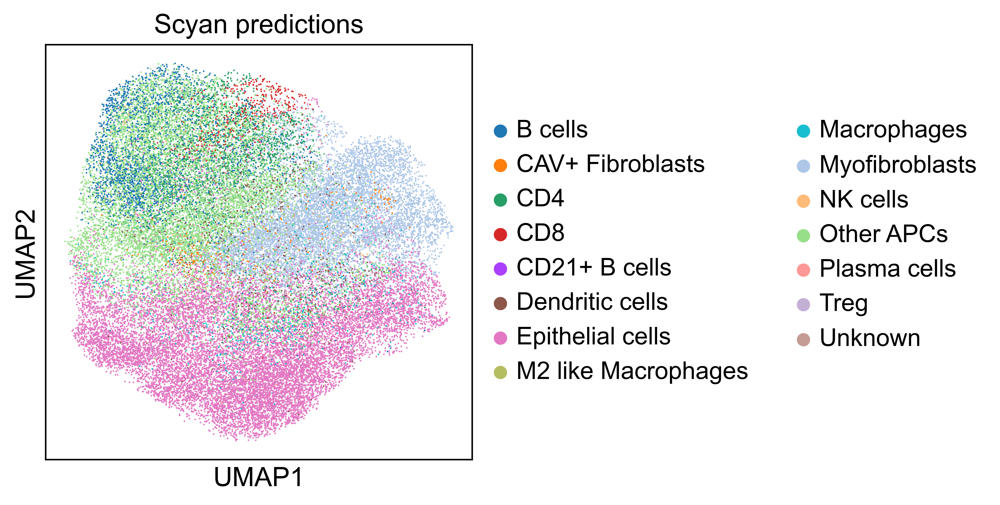

In [81]:
palette = scyan.tools.palette_level(table)
palette["Unknown"] = "#bbb" # Only if you renamed the np.nan cells as "Unknown"

scyan.plot.umap(adata, color="scyan_pop", title="Scyan predictions")

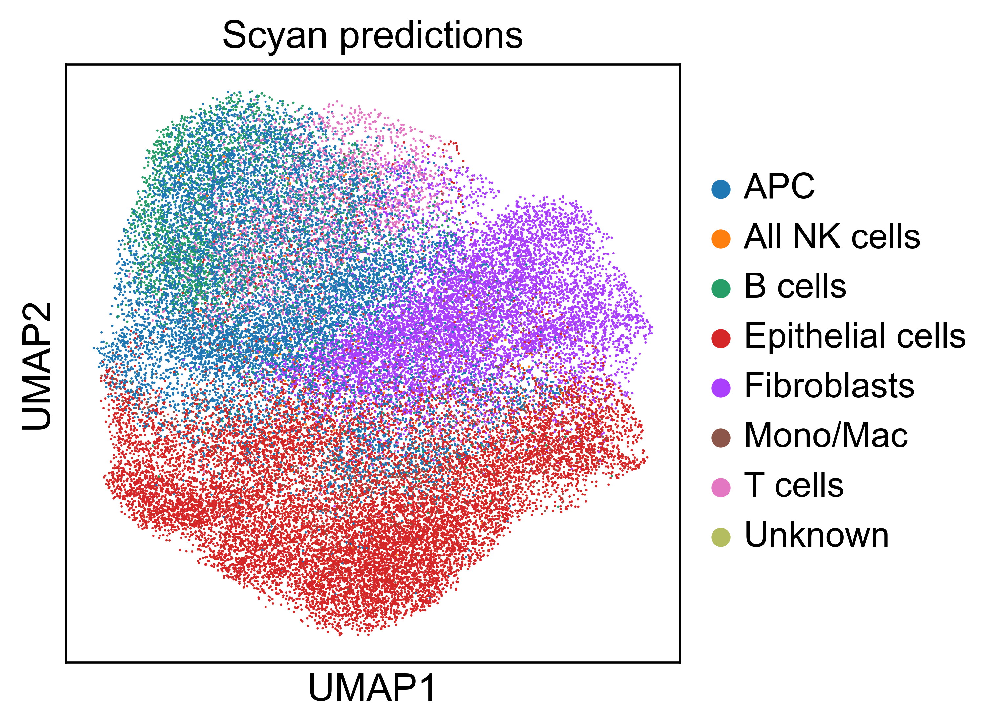

In [82]:
palette = scyan.tools.palette_level(table)
palette["Unknown"] = "#bbb" # Only if you renamed the np.nan cells as "Unknown"

scyan.plot.umap(adata, color="scyan_pop_Level_3", title="Scyan predictions")

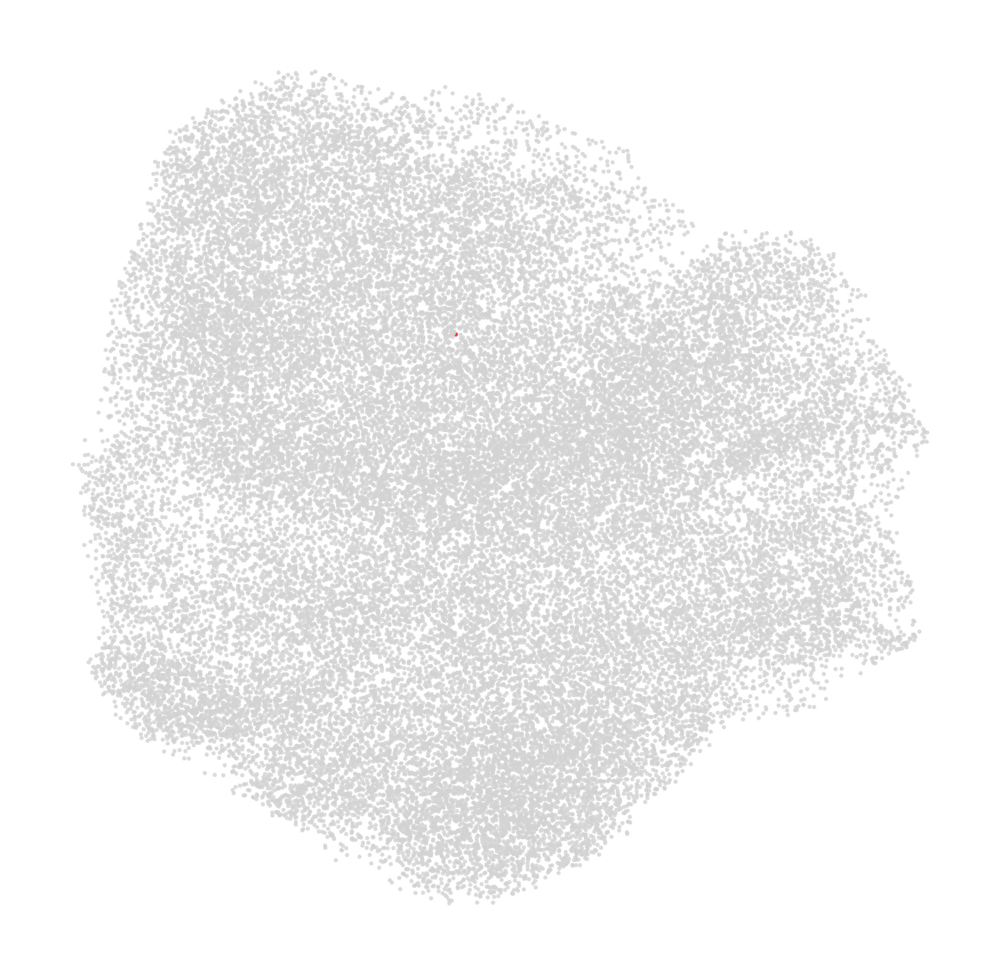

In [83]:
# Specify the cluster of interest
specific_cluster = 'Unknown'
# Assign colors to cells in the cluster of interest and set other cells to gray
adata.obs['color'] = np.where(adata.obs['scyan_pop'] == specific_cluster, 'red', 'lightgray')
# Plot the UMAP with the specific cluster highlighted
plt.scatter(adata.obsm['X_umap'][:, 0], adata.obsm['X_umap'][:, 1],
            color=adata.obs['color'], s=1, alpha=0.8, edgecolor='none')
plt.axis('off')
plt.show()

In [84]:
#Identifying marker genes for each population
sc.tl.rank_genes_groups(adata, 'scyan_pop', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=10, sharey=False, save= "highest_ranked_markers_cellposev2.png")

ranking genes


ValueError: Could not calculate statistics for groups Unknown, CD21+ B cells since they only contain one sample.

In [85]:
# compute hierarchical clustering using PCs (several distance metrics and linkage methods are available).
sc.tl.dendrogram(adata, 'scyan_pop')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_scyan_pop']`


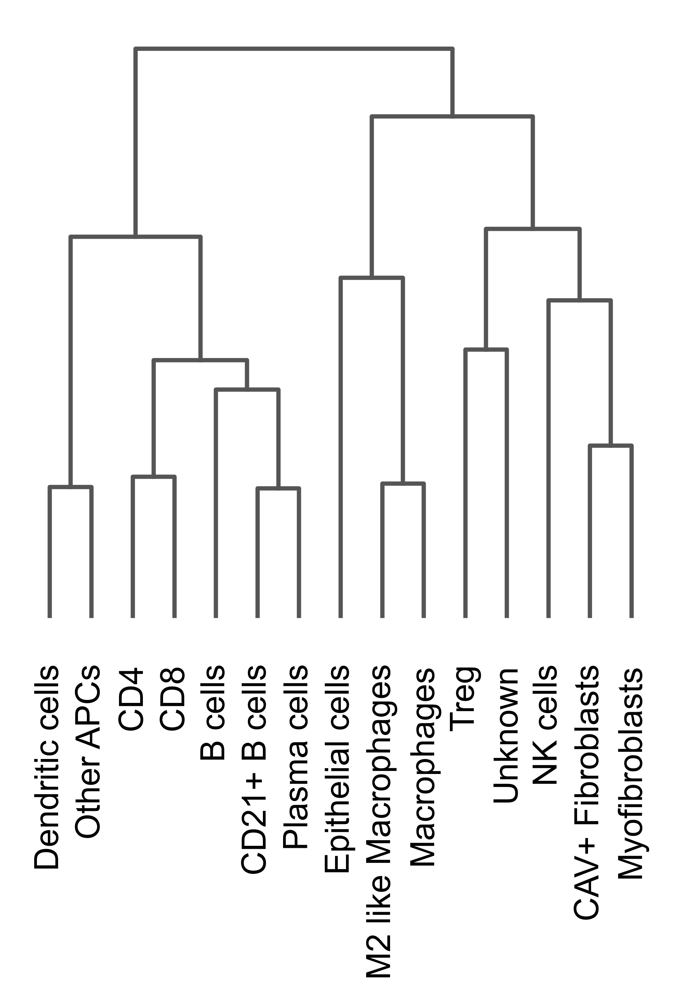

<Axes: >

In [86]:
sc.pl.dendrogram(adata, 'scyan_pop')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_scyan_pop_Level_3']`


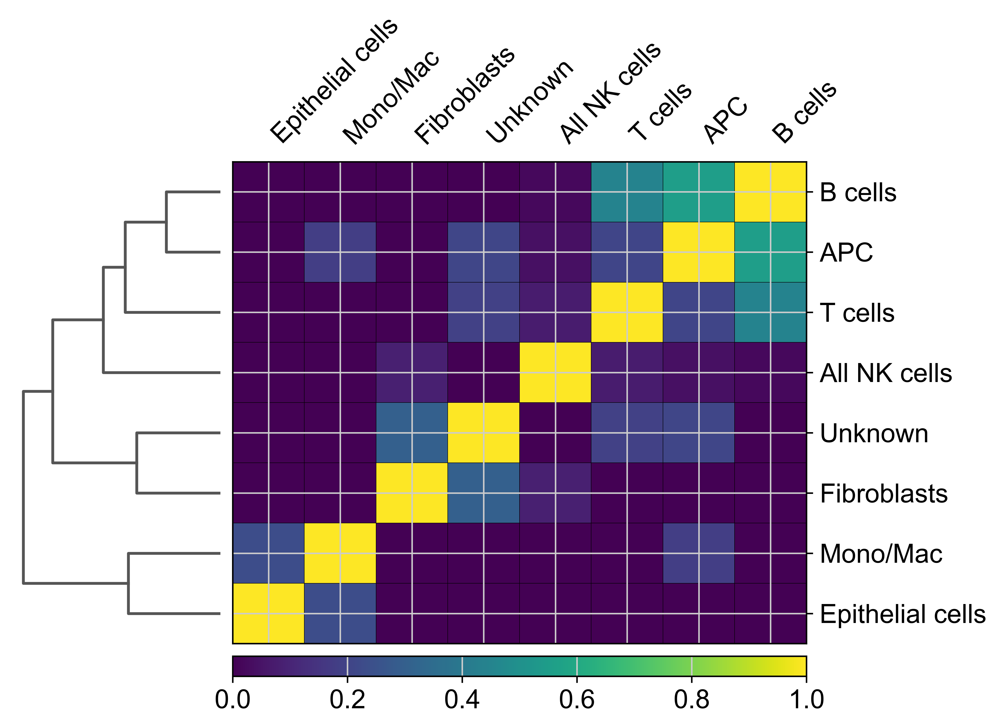

In [87]:
cmap = 'viridis'
sc.pl.correlation_matrix(adata, 'scyan_pop_Level_3', cmap=cmap, vmin=0, vmax=1, figsize=(7.5,5), save="Correlation_matrix_pop_level3_mesmerv2_filtered.png" )


## Saving cluster information with MIBI data for inpection of Mantis viewer

In [88]:
os.getcwd()

'C:\\Users\\Peter\\Documents\\Internship_DKFZ\\Visual_coding_studio\\mibi_analysis_yw\\notebook\\2023-07-18-KK-BC25_21_1_KK003\\cellpose\\output'

In [89]:
clusters = adata.obs.drop(axis=1, columns=['fov', 'roi', 'X', 'Y'])

df = pd.read_csv(os.path.join(cell_table_dir,'cell_table_size_normalized_cellposev2_filtered_preprocessed.csv'))


print(df)

       cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          494.0  0.364853  0.638003  0.595751  0.405632  0.430401  0.724664   
1          234.0  0.191695  0.145012  0.263087  0.310193  0.122239  0.289815   
2          258.0  0.240297  0.331027  0.404550  0.058453  0.148478  0.028087   
3          227.0  0.326913  0.136826  0.262335  0.000000  0.000480  0.054984   
4          600.0  0.372172  0.486707  0.706241  0.092782  0.429288  0.050504   
...          ...       ...       ...       ...       ...       ...       ...   
40914      131.0  0.684377  0.282331  0.000000  0.814550  0.795935  0.258471   
40915      110.0  0.858236  0.842575  0.551167  0.597896  0.787505  0.557028   
40916      127.0  0.186727  0.000000  0.000000  0.198229  0.000000  0.000000   
40917      111.0  0.549322  0.337533  0.000000  0.436929  0.341985  0.149680   
40918       59.0  0.000000  0.713080  0.000000  0.181923  0.283123  0.163253   

           CD20      CD21      CD23  ..

In [90]:
print(clusters)

            scyan_pop scyan_pop_Level_3 scyan_pop_Level_2 scyan_pop_Level_1  \
0          Other APCs               APC           Myeloid           Immune    
1          Other APCs               APC           Myeloid           Immune    
2      Myofibroblasts       Fibroblasts            Stroma        Non-immune   
3      Myofibroblasts       Fibroblasts            Stroma        Non-immune   
4      Myofibroblasts       Fibroblasts            Stroma        Non-immune   
...               ...               ...               ...               ...   
40914      Other APCs               APC           Myeloid           Immune    
40915         B cells           B cells          Lymphoid           Immune    
40916         B cells           B cells          Lymphoid           Immune    
40917         B cells           B cells          Lymphoid           Immune    
40918        NK cells      All NK cells          Lymphoid           Immune    

           color  
0      lightgray  
1      lightg

In [91]:
df.columns

Index(['cell_size', 'ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20',
       'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8',
       'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1',
       'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1',
       'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox', 'label', 'area', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'perimeter', 'convex_area',
       'equivalent_diameter', 'X', 'Y', 'major_minor_axis_ratio',
       'perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif', 'num_concavities', 'fov', 'roi'],
      dtype='object')

In [92]:
df_updated = df.join(clusters.reset_index(drop=True))

### Save updated dataframe

This is the dataframe we are going to use for any further analysis too!

In [93]:
df_updated.to_csv(os.path.join(cell_table_dir,'2023-07-18-KK-BC25_21_1_cell_table_clustered_cellposev2.csv'))

In [94]:
print(df_updated.columns)
df_updated.head

Index(['cell_size', 'ASCT2', 'ATP5A', 'CAV', 'CD11c', 'CD138', 'CD163', 'CD20',
       'CD21', 'CD23', 'CD3', 'CD36', 'CD4', 'CD45', 'CD56', 'CD68', 'CD8',
       'CD98', 'CPT1A', 'CS', 'CXCL13', 'CytC', 'FOXP3', 'GLS', 'GLUT1',
       'GZMB', 'HLADQA1', 'HLADR', 'HLAI', 'IL10', 'Ki67', 'PD1', 'PDL1',
       'PKM2', 'PanCK', 'SMA', 'TCF', 'Tox', 'label', 'area', 'eccentricity',
       'major_axis_length', 'minor_axis_length', 'perimeter', 'convex_area',
       'equivalent_diameter', 'X', 'Y', 'major_minor_axis_ratio',
       'perim_square_over_area', 'major_axis_equiv_diam_ratio',
       'convex_hull_resid', 'centroid_dif', 'num_concavities', 'fov', 'roi',
       'scyan_pop', 'scyan_pop_Level_3', 'scyan_pop_Level_2',
       'scyan_pop_Level_1', 'color'],
      dtype='object')


<bound method NDFrame.head of        cell_size     ASCT2     ATP5A       CAV     CD11c     CD138     CD163  \
0          494.0  0.364853  0.638003  0.595751  0.405632  0.430401  0.724664   
1          234.0  0.191695  0.145012  0.263087  0.310193  0.122239  0.289815   
2          258.0  0.240297  0.331027  0.404550  0.058453  0.148478  0.028087   
3          227.0  0.326913  0.136826  0.262335  0.000000  0.000480  0.054984   
4          600.0  0.372172  0.486707  0.706241  0.092782  0.429288  0.050504   
...          ...       ...       ...       ...       ...       ...       ...   
40914      131.0  0.684377  0.282331  0.000000  0.814550  0.795935  0.258471   
40915      110.0  0.858236  0.842575  0.551167  0.597896  0.787505  0.557028   
40916      127.0  0.186727  0.000000  0.000000  0.198229  0.000000  0.000000   
40917      111.0  0.549322  0.337533  0.000000  0.436929  0.341985  0.149680   
40918       59.0  0.000000  0.713080  0.000000  0.181923  0.283123  0.163253   

         

In [95]:
clusters.head()

,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,Other APCs,APC,Myeloid,Immune,lightgray
1,Other APCs,APC,Myeloid,Immune,lightgray
2,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
4,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray


In [96]:
df_updated.head()

,cell_size,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,...,convex_hull_resid,centroid_dif,num_concavities,fov,roi,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,494.0,0.364853,0.638003,0.595751,0.405632,0.430401,0.724664,0.359631,0.608392,0.312971,...,0.081784,0.023140,2.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Other APCs,APC,Myeloid,Immune,lightgray
1,234.0,0.191695,0.145012,0.263087,0.310193,0.122239,0.289815,0.004861,0.320027,0.054814,...,0.067729,0.001739,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Other APCs,APC,Myeloid,Immune,lightgray
2,258.0,0.240297,0.331027,0.404550,0.058453,0.148478,0.028087,0.014166,0.254979,0.090308,...,0.040892,0.010645,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,227.0,0.326913,0.136826,0.262335,0.000000,0.000480,0.054984,0.034586,0.131241,0.083411,...,0.029915,0.003291,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
4,600.0,0.372172,0.486707,0.706241,0.092782,0.429288,0.050504,0.096808,0.365253,0.289956,...,0.043062,0.007900,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray


In [97]:
df_updated.drop(columns=df_updated.columns[0], axis=1, inplace=True)
df_updated.head()

,ASCT2,ATP5A,CAV,CD11c,CD138,CD163,CD20,CD21,CD23,CD3,...,convex_hull_resid,centroid_dif,num_concavities,fov,roi,scyan_pop,scyan_pop_Level_3,scyan_pop_Level_2,scyan_pop_Level_1,color
0,0.364853,0.638003,0.595751,0.405632,0.430401,0.724664,0.359631,0.608392,0.312971,0.407235,...,0.081784,0.023140,2.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Other APCs,APC,Myeloid,Immune,lightgray
1,0.191695,0.145012,0.263087,0.310193,0.122239,0.289815,0.004861,0.320027,0.054814,0.357485,...,0.067729,0.001739,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Other APCs,APC,Myeloid,Immune,lightgray
2,0.240297,0.331027,0.404550,0.058453,0.148478,0.028087,0.014166,0.254979,0.090308,0.226708,...,0.040892,0.010645,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
3,0.326913,0.136826,0.262335,0.000000,0.000480,0.054984,0.034586,0.131241,0.083411,0.047561,...,0.029915,0.003291,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray
4,0.372172,0.486707,0.706241,0.092782,0.429288,0.050504,0.096808,0.365253,0.289956,0.284985,...,0.043062,0.007900,0.0,2023-07-18-KK-BC25_21_1_FOV1,BC25_21_1_FOV1,Myofibroblasts,Fibroblasts,Stroma,Non-immune,lightgray


In [98]:
# Using a dict-comprehension, the unique 'method' value will be the key
clusters_per_fov = {g: d for g, d in df_updated.groupby('fov')}

In [99]:
clusters_per_fov.keys()


dict_keys(['2023-07-18-KK-BC25_21_1_FOV1', '2023-07-18-KK-BC25_21_1_FOV2', '2023-07-18-KK-BC25_21_1_FOV3', '2023-07-18-KK-BC25_21_1_FOV4', '2023-07-18-KK-BC25_21_1_FOV5', '2023-07-18-KK-BC25_21_1_FOV6'])

In [100]:
one_fov = clusters_per_fov['2023-07-18-KK-BC25_21_1_FOV1']
one_fov = one_fov[['label','scyan_pop']]
one_fov.to_csv(os.path.join(cell_table_dir,'2023-07-18-KK-BC25_21_1_FOV1_clustered_cellposev2.csv'),index=False,header=False)


In [101]:
one_fov = clusters_per_fov['2023-07-18-KK-BC25_21_1_FOV2']
one_fov = one_fov[['label','scyan_pop']]
one_fov.to_csv(os.path.join(cell_table_dir,'2023-07-18-KK-BC25_21_1_FOV2_clustered_cellposev2.csv'),index=False,header=False)
